# Exercise 05 — Video Processing using OpenCV




## Step 1: Common setup

Run this cell first. It imports OpenCV, NumPy, Matplotlib, and helper functions for displaying images/videos inside Colab.


In [1]:
# Common setup for Google Colab
import os
import cv2
import base64
import shutil
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML, display, clear_output
from tqdm.auto import tqdm

plt.rcParams["figure.figsize"] = (10, 6)

def show_bgr(img, title="Image", size=(8, 5)):
    """Display a BGR/OpenCV image correctly in notebook."""
    plt.figure(figsize=size)
    if img is None:
        print("Image is None")
        return
    if img.ndim == 2:
        plt.imshow(img, cmap="gray")
    else:
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis("off")
    plt.show()

def show_gray(img, title="Image", size=(8, 5)):
    """Display a grayscale image."""
    plt.figure(figsize=size)
    plt.imshow(img, cmap="gray")
    plt.title(title)
    plt.axis("off")
    plt.show()

def display_video(path, width=720):
    """Display a video inside Colab/Jupyter."""
    if not os.path.exists(path):
        raise FileNotFoundError(path)

    with open(path, "rb") as f:
        video_data = f.read()

    encoded = base64.b64encode(video_data).decode("utf-8")

    return HTML(f"""
    <video width="{width}" controls>
        <source src="data:video/mp4;base64,{encoded}" type="video/mp4">
        Your browser does not support the video tag.
    </video>
    """)

def safe_fps(value, default=25):
    """Fix invalid FPS values sometimes returned by OpenCV."""
    if value is None or value <= 1 or np.isnan(value):
        return default
    return value

def resize_keep_aspect(frame, target_width=720):
    """Resize frame while keeping aspect ratio."""
    h, w = frame.shape[:2]
    if w <= target_width:
        return frame
    scale = target_width / w
    new_h = int(h * scale)
    return cv2.resize(frame, (target_width, new_h))

print("OpenCV version:", cv2.__version__)
print("Setup complete ✅")


OpenCV version: 4.13.0
Setup complete ✅


## Step 2: Upload your own video

Run this cell and choose a video from your computer.

Supported formats usually include: `.mp4`, `.avi`, `.mov`, `.mkv`.

For smooth Colab performance, use a short video first, like **10–30 seconds**.


In [2]:
# Upload your own video in Google Colab
# After running this cell, click "Choose Files" and select your video.

try:
    from google.colab import files
    uploaded = files.upload()

    if len(uploaded) == 0:
        raise RuntimeError("No file uploaded. Please run this cell again and upload a video.")

    uploaded_filename = list(uploaded.keys())[0]
    input_video_path = uploaded_filename

    print("Uploaded video:", input_video_path)
    print("File size:", round(os.path.getsize(input_video_path) / (1024 * 1024), 2), "MB")

except ImportError:
    # This fallback helps if you run the notebook outside Colab.
    # Put your video in the same folder and type its file name here.
    input_video_path = "your_video.mp4"
    print("Not running inside Colab.")
    print("Place your video in the notebook folder and set input_video_path =", input_video_path)

video_path = input_video_path


Saving video.mp4 to video.mp4
Uploaded video: video.mp4
File size: 1.04 MB


## Step 3: Video settings

You can adjust these values before processing.

- `OUTPUT_WIDTH`: smaller width means faster processing.
- `PROCESS_MAX_SECONDS`: keep as `30` for demo/testing. Use `None` to process full video.
- `MIN_CONTOUR_AREA`: increase if small noise is detected; decrease if your moving object is small.


In [3]:
# Processing controls

OUTPUT_WIDTH = 720          # Resize output video width for faster processing
PROCESS_MAX_SECONDS = 30    # Use None to process the full video
MIN_CONTOUR_AREA = 900      # Minimum moving object size
SHOW_INPUT_VIDEO = True     # Set False if video is very large

print("Settings loaded ✅")
print("OUTPUT_WIDTH:", OUTPUT_WIDTH)
print("PROCESS_MAX_SECONDS:", PROCESS_MAX_SECONDS)
print("MIN_CONTOUR_AREA:", MIN_CONTOUR_AREA)


Settings loaded ✅
OUTPUT_WIDTH: 720
PROCESS_MAX_SECONDS: 30
MIN_CONTOUR_AREA: 900


## Step 4: Read video information and show first frame

This verifies that OpenCV can read your uploaded video.


Video path: video.mp4
Frame count: 153
FPS: 29.97
Resolution: 478 x 850
Duration: 5.1 seconds


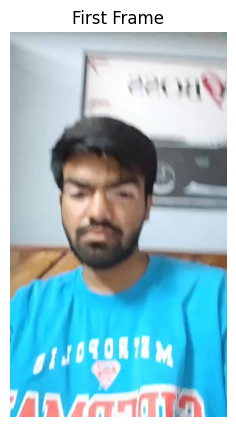

Input video preview:


In [4]:
# Read video details

if not os.path.exists(video_path):
    raise FileNotFoundError(f"Video not found: {video_path}")

cap = cv2.VideoCapture(video_path)

if not cap.isOpened():
    raise RuntimeError("OpenCV could not open the video. Try uploading an MP4 file.")

frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
video_fps = safe_fps(cap.get(cv2.CAP_PROP_FPS))
video_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
video_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
duration_seconds = frame_count / video_fps if video_fps else 0

print("Video path:", video_path)
print("Frame count:", frame_count)
print("FPS:", round(video_fps, 2))
print("Resolution:", video_width, "x", video_height)
print("Duration:", round(duration_seconds, 2), "seconds")

ret, first_frame = cap.read()
cap.release()

if not ret:
    raise RuntimeError("Could not read the first frame from the video.")

first_frame_resized = resize_keep_aspect(first_frame, OUTPUT_WIDTH)
show_bgr(first_frame_resized, "First Frame")

if SHOW_INPUT_VIDEO:
    print("Input video preview:")
    display(display_video(video_path, width=min(OUTPUT_WIDTH, 720)))


## Step 5: Frame differencing

Frame differencing compares consecutive frames. The white regions show areas where motion happened.


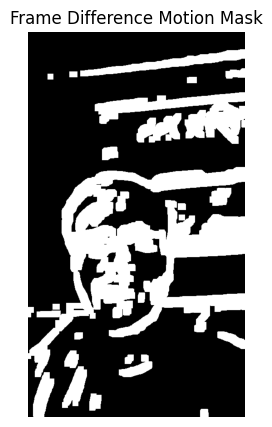

In [5]:
# Frame differencing motion mask preview

cap = cv2.VideoCapture(video_path)
ret, prev_frame = cap.read()

if not ret:
    raise RuntimeError("Could not read the first frame.")

prev_frame = resize_keep_aspect(prev_frame, OUTPUT_WIDTH)
prev_gray = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)
prev_gray = cv2.GaussianBlur(prev_gray, (5, 5), 0)

motion_preview = None
frames_to_check = int(min(frame_count, video_fps * 5))  # first 5 seconds preview

for _ in range(frames_to_check):
    ret, frame = cap.read()
    if not ret:
        break

    frame = resize_keep_aspect(frame, OUTPUT_WIDTH)
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (5, 5), 0)

    diff = cv2.absdiff(prev_gray, gray)
    _, thresh = cv2.threshold(diff, 25, 255, cv2.THRESH_BINARY)
    thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, np.ones((5, 5), np.uint8))
    thresh = cv2.dilate(thresh, np.ones((5, 5), np.uint8), iterations=2)

    motion_preview = thresh
    prev_gray = gray

cap.release()

if motion_preview is not None:
    show_gray(motion_preview, "Frame Difference Motion Mask")
else:
    print("No motion preview generated.")


## Step 6: Background subtraction + object tracking

This creates a processed output video with:

- Motion mask
- Bounding boxes around moving objects
- Center point tracking
- Movement trail
- Frame number and object count


In [6]:
# Background subtraction and moving object tracking

output_path = "processed_uploaded_video.mp4"

cap = cv2.VideoCapture(video_path)

original_fps = safe_fps(cap.get(cv2.CAP_PROP_FPS))
original_frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

# Read first frame to determine output size after resizing
ret, sample_frame = cap.read()
if not ret:
    cap.release()
    raise RuntimeError("Could not read video.")

sample_frame = resize_keep_aspect(sample_frame, OUTPUT_WIDTH)
out_height, out_width = sample_frame.shape[:2]

# Reset video to first frame
cap.set(cv2.CAP_PROP_POS_FRAMES, 0)

if PROCESS_MAX_SECONDS is None:
    max_frames = original_frame_count
else:
    max_frames = min(original_frame_count, int(original_fps * PROCESS_MAX_SECONDS))

fourcc = cv2.VideoWriter_fourcc(*"mp4v")
writer = cv2.VideoWriter(output_path, fourcc, original_fps, (out_width, out_height))

bg_subtractor = cv2.createBackgroundSubtractorMOG2(
    history=150,
    varThreshold=40,
    detectShadows=True
)

trajectory_points = []
frame_index = 0
total_detections = 0

for _ in tqdm(range(max_frames), desc="Processing video"):
    ret, frame = cap.read()
    if not ret:
        break

    frame = resize_keep_aspect(frame, OUTPUT_WIDTH)

    # Background subtraction
    fg_mask = bg_subtractor.apply(frame)

    # Remove shadows and noise
    _, fg_mask = cv2.threshold(fg_mask, 200, 255, cv2.THRESH_BINARY)
    fg_mask = cv2.morphologyEx(fg_mask, cv2.MORPH_OPEN, np.ones((5, 5), np.uint8))
    fg_mask = cv2.dilate(fg_mask, np.ones((7, 7), np.uint8), iterations=2)

    # Find moving object contours
    contours, _ = cv2.findContours(fg_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    detections_this_frame = 0
    largest_center = None
    largest_area = 0

    for cnt in contours:
        area = cv2.contourArea(cnt)

        if area < MIN_CONTOUR_AREA:
            continue

        x, y, w, h = cv2.boundingRect(cnt)
        cx, cy = x + w // 2, y + h // 2

        detections_this_frame += 1
        total_detections += 1

        # Draw bounding box
        cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)
        cv2.circle(frame, (cx, cy), 5, (0, 0, 255), -1)
        cv2.putText(
            frame,
            "Moving Object",
            (x, max(25, y - 8)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.55,
            (0, 255, 0),
            2
        )

        if area > largest_area:
            largest_area = area
            largest_center = (cx, cy)

    # Track only the largest moving object trail to avoid messy lines
    if largest_center is not None:
        trajectory_points.append(largest_center)

    # Keep only last 80 trail points
    trajectory_points = trajectory_points[-80:]

    for j in range(1, len(trajectory_points)):
        cv2.line(frame, trajectory_points[j - 1], trajectory_points[j], (255, 255, 0), 2)

    # Add info overlay
    cv2.rectangle(frame, (0, 0), (out_width, 42), (0, 0, 0), -1)
    cv2.putText(
        frame,
        f"Frame: {frame_index + 1}/{max_frames} | Objects: {detections_this_frame}",
        (12, 28),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.7,
        (255, 255, 255),
        2
    )

    writer.write(frame)
    frame_index += 1

cap.release()
writer.release()

print("Processing complete ✅")
print("Frames processed:", frame_index)
print("Total detections:", total_detections)
print("Output saved as:", output_path)
print("Output size:", round(os.path.getsize(output_path) / (1024 * 1024), 2), "MB")


Processing video:   0%|          | 0/153 [00:00<?, ?it/s]

Processing complete ✅
Frames processed: 153
Total detections: 1683
Output saved as: processed_uploaded_video.mp4
Output size: 9.01 MB


## Step 7: Display and download the processed video

Run this cell to view the output and download it to your computer.


In [7]:
# Display and download output video

display(display_video(output_path, width=min(OUTPUT_WIDTH, 720)))

try:
    from google.colab import files
    files.download(output_path)
except ImportError:
    print("Download works automatically in Google Colab.")
    print("Output file:", output_path)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Observation / Conclusion

In this experiment, a custom uploaded video was processed using OpenCV.  
The video was read frame by frame, motion regions were detected using frame differencing and background subtraction, and moving objects were highlighted using bounding boxes and tracking trails.

This demonstrates basic video processing concepts such as frame extraction, background subtraction, motion detection, object localization, and movement tracking.
